In [ ]:
!pip install split-folders


number of elements =  2515


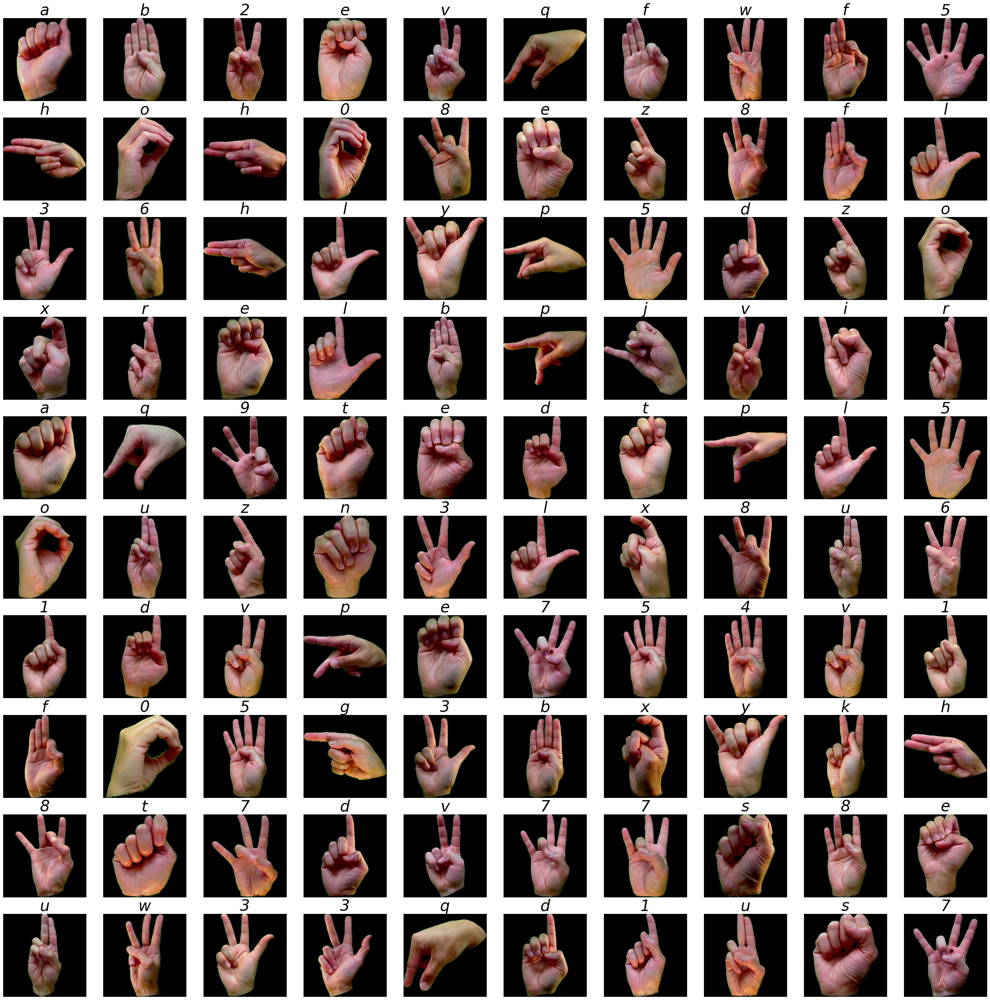

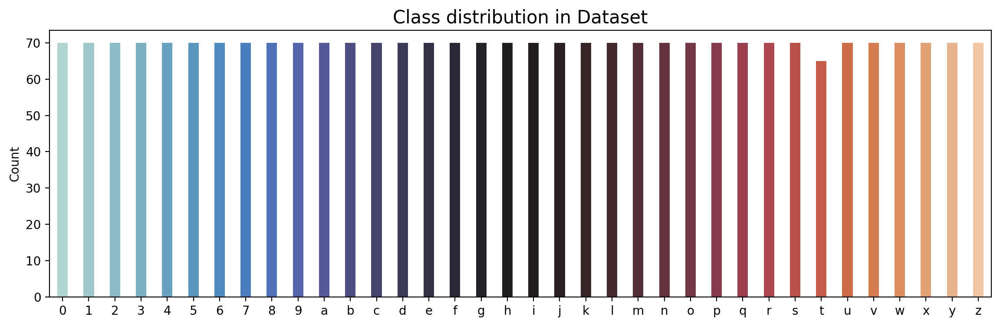

Copying files: 2515 files [00:00, 2800.91 files/s]


Found 2012 images belonging to 36 classes.
Found 251 images belonging to 36 classes.
Found 252 images belonging to 36 classes.
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 200, 200, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 200, 200, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 100, 100, 32)      0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 100, 100, 32)      0         
                                                                 
 conv2d_2 (Conv2D)           (None, 100, 100, 64)      18496     
                                                             

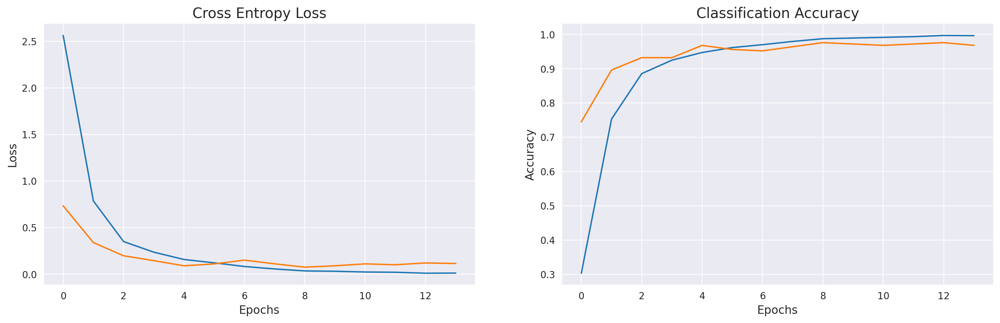

In [ ]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import splitfolders
import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dense,Conv2D,Dropout,Flatten,MaxPooling2D, BatchNormalization,Input,concatenate
from keras.callbacks import EarlyStopping,ReduceLROnPlateau
from keras.utils import plot_model
from sklearn.metrics import classification_report, confusion_matrix



# Path where our data is located
base_path = "/content/datasets/asl_dataset/"

# Dictionary to save our 36 classes
categories = {  0: "0",
                1: "1",
                2: "2",
                3: "3",
                4: "4",
                5: "5",
                6: "6",
                7: "7",
                8: "8",
                9: "9",
                10: "a",
                11: "b",
                12: "c",
                13: "d",
                14: "e",
                15: "f",
                16: "g",
                17: "h",
                18: "i",
                19: "j",
                20: "k",
                21: "l",
                22: "m",
                23: "n",
                24: "o",
                25: "p",
                26: "q",
                27: "r",
                28: "s",
                29: "t",
                30: "u",
                31: "v",
                32: "w",
                33: "x",
                34: "y",
                35: "z",
            }

def add_class_name_prefix(df, col_name):
    df[col_name] = df[col_name].apply(
        lambda x: x[re.search("_", x).start() + 1 : re.search("_", x).start() + 2]
        + "/"
        + x
    )
    return df

# list conatining all the filenames in the dataset
filenames_list = []
# list to store the corresponding category, note that each folder of the dataset has one class of data
categories_list = []

for category in categories:

    filenames = os.listdir(base_path + categories[category])
    filenames_list = filenames_list + filenames
    categories_list = categories_list + [category] * len(filenames)

df = pd.DataFrame({"filename": filenames_list, "category": categories_list})
df = add_class_name_prefix(df, "filename")

# Shuffle the dataframe
df = df.sample(frac=1).reset_index(drop=True)
df



print("number of elements = ", len(df))


plt.figure(figsize=(40,40))

for i in range(100):
    path = base_path + df.filename[i]
    img = plt.imread(path)
    plt.subplot(10,10, i + 1)
    plt.imshow(img)
    plt.title(categories[df.category[i]],fontsize=35,fontstyle='italic')
    plt.axis("off")


label,count = np.unique(df.category,return_counts=True)
uni = pd.DataFrame(data=count,index=categories.values(),columns=['Count'])

plt.figure(figsize=(14,4),dpi=200)
sns.barplot(data=uni,x=uni.index,y='Count',palette='icefire',width=0.4).set_title('Class distribution in Dataset',fontsize=15)
plt.show()


splitfolders.ratio('/content/datasets/asl_dataset/asl_dataset/',output='/content/datasets/working/', seed=1333, ratio=(0.8,0.1,0.1))


# The data for will used by flow_from_directory.
# The batch size is 32 and the image size is (150,150).
# The Image Data Generator will be used to rescale the images.

datagen = ImageDataGenerator(rescale= 1.0 / 255)

# Finally, we will list out all the important parameters and respective values.

train_path = '/content/datasets/working/train'
val_path = '/content/datasets/working/val'
test_path = '/content/datasets/working/test'

batch = 32
image_size = 200
img_channel = 3
n_classes = 36

# We will import the data from directory.
# we will set shuffle = False for test data.

train_data = datagen.flow_from_directory(directory= train_path,
                                         target_size=(image_size,image_size),
                                         batch_size = batch,
                                         class_mode='categorical')

val_data = datagen.flow_from_directory(directory= val_path,
                                       target_size=(image_size,image_size),
                                       batch_size = batch,
                                       class_mode='categorical',
                                       )

test_data = datagen.flow_from_directory(directory= test_path,
                                         target_size=(image_size,image_size),
                                         batch_size = batch,
                                         class_mode='categorical',
                                         shuffle= False)




#Deep Learning Model

model = Sequential()
# input layer
# Block 1
model.add(Conv2D(32,3,activation='relu',padding='same',input_shape = (image_size,image_size,img_channel)))
model.add(Conv2D(32,3,activation='relu',padding='same'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.2))

# Block 2
model.add(Conv2D(64,3,activation='relu',padding='same'))
model.add(Conv2D(64,3,activation='relu',padding='same'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.3))

#Block 3
model.add(Conv2D(128,3,activation='relu',padding='same'))
model.add(Conv2D(128,3,activation='relu',padding='same'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.4))

# fully connected layer
model.add(Flatten())

model.add(Dense(512,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(128,activation='relu'))
model.add(Dropout(0.3))

# output layer
model.add(Dense(36, activation='softmax'))


model.summary()


#call back
#EarlyStopping ,  ReduceLROnPlateau
early_stoping = EarlyStopping(monitor='val_loss',
                              min_delta=0.001,
                              patience= 5,
                              restore_best_weights= True,
                              verbose = 0)

reduce_learning_rate = ReduceLROnPlateau(monitor='val_accuracy',
                                         patience = 2,
                                         factor=0.5 ,
                                         verbose = 1)


model.compile(optimizer='adam', loss = 'categorical_crossentropy' , metrics=['accuracy'])


asl_class_sequential = model.fit(train_data,
                      validation_data= val_data,
                      epochs=30,
                      callbacks=[early_stoping,reduce_learning_rate],
                      verbose = 1)


# Evaluvate for train generator
loss,acc = model.evaluate(train_data , verbose = 0)

print('The accuracy of the model for training data is:',acc*100)
print('The Loss of the model for training data is:',loss)

# Evaluvate for validation generator
loss,acc = model.evaluate(val_data, verbose = 0)

print('The accuracy of the model for validation data is:',acc*100)
print('The Loss of the model for validation data is:',loss)


# plots for accuracy and Loss with epochs

error = pd.DataFrame(asl_class_sequential.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()


In [ ]:
import zipfile
import io

file_path = 'archive.zip'

with zipfile.ZipFile(file_path, 'r') as zip_ref:
    zip_ref.extractall('datasets')


number of elements =  2515


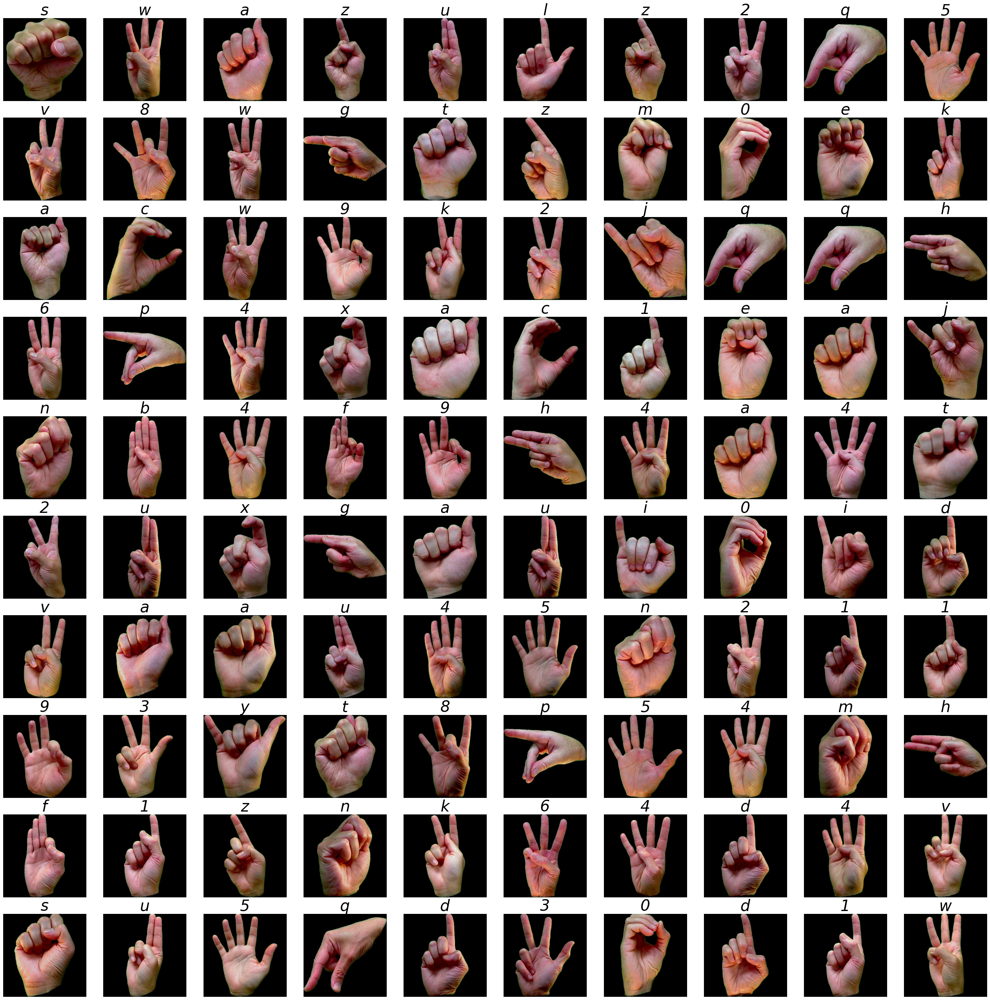

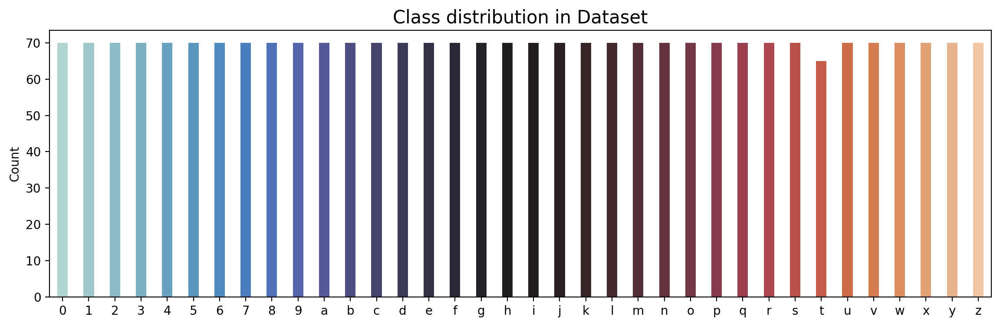

Copying files: 2515 files [00:00, 3301.09 files/s]


Found 2012 images belonging to 36 classes.
Found 251 images belonging to 36 classes.
Found 252 images belonging to 36 classes.
Epoch 1/30
63/63 [==============================] - 882s 14s/step - loss: 3.5849 - accuracy: 0.0214 - val_loss: 3.5835 - val_accuracy: 0.0279 - lr: 0.0010
Epoch 2/30
63/63 [==============================] - 770s 12s/step - loss: 3.5842 - accuracy: 0.0199 - val_loss: 3.5835 - val_accuracy: 0.0279 - lr: 0.0010
Epoch 3/30
63/63 [==============================] - ETA: 0s - loss: 3.5842 - accuracy: 0.0253 
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
63/63 [==============================] - 753s 12s/step - loss: 3.5842 - accuracy: 0.0253 - val_loss: 3.5835 - val_accuracy: 0.0279 - lr: 0.0010
Epoch 4/30
63/63 [==============================] - 751s 12s/step - loss: 3.5837 - accuracy: 0.0268 - val_loss: 3.5835 - val_accuracy: 0.0279 - lr: 5.0000e-04
Epoch 5/30
63/63 [==============================] - ETA: 0s - loss: 3.5838 - accuracy: 0.

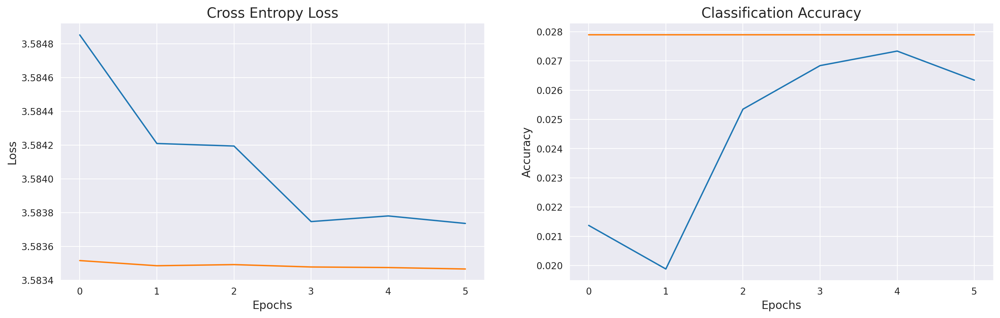

In [ ]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import splitfolders
import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Input, Conv2D, Dropout, Flatten, Dense, MaxPooling2D, GlobalAveragePooling2D, Multiply
from keras.models import Model
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix


# Path where our data is located
base_path = "/content/datasets/asl_dataset/"

# Dictionary to save our 36 classes
categories = {  0: "0",
                1: "1",
                2: "2",
                3: "3",
                4: "4",
                5: "5",
                6: "6",
                7: "7",
                8: "8",
                9: "9",
                10: "a",
                11: "b",
                12: "c",
                13: "d",
                14: "e",
                15: "f",
                16: "g",
                17: "h",
                18: "i",
                19: "j",
                20: "k",
                21: "l",
                22: "m",
                23: "n",
                24: "o",
                25: "p",
                26: "q",
                27: "r",
                28: "s",
                29: "t",
                30: "u",
                31: "v",
                32: "w",
                33: "x",
                34: "y",
                35: "z",
            }

def add_class_name_prefix(df, col_name):
    df[col_name] = df[col_name].apply(
        lambda x: x[re.search("_", x).start() + 1 : re.search("_", x).start() + 2]
        + "/"
        + x
    )
    return df

# list conatining all the filenames in the dataset
filenames_list = []
# list to store the corresponding category, note that each folder of the dataset has one class of data
categories_list = []

for category in categories:

    filenames = os.listdir(base_path + categories[category])
    filenames_list = filenames_list + filenames
    categories_list = categories_list + [category] * len(filenames)

df = pd.DataFrame({"filename": filenames_list, "category": categories_list})
df = add_class_name_prefix(df, "filename")

# Shuffle the dataframe
df = df.sample(frac=1).reset_index(drop=True)
df



print("number of elements = ", len(df))


plt.figure(figsize=(40,40))

for i in range(100):
    path = base_path + df.filename[i]
    img = plt.imread(path)
    plt.subplot(10,10, i + 1)
    plt.imshow(img)
    plt.title(categories[df.category[i]],fontsize=35,fontstyle='italic')
    plt.axis("off")


label,count = np.unique(df.category,return_counts=True)
uni = pd.DataFrame(data=count,index=categories.values(),columns=['Count'])

plt.figure(figsize=(14,4),dpi=200)
sns.barplot(data=uni,x=uni.index,y='Count',palette='icefire',width=0.4).set_title('Class distribution in Dataset',fontsize=15)
plt.show()


splitfolders.ratio('/content/datasets/asl_dataset/asl_dataset/',output='/content/datasets/working/', seed=1333, ratio=(0.8,0.1,0.1))


# The data for will used by flow_from_directory.
# The batch size is 32 and the image size is (150,150).
# The Image Data Generator will be used to rescale the images.

datagen = ImageDataGenerator(rescale= 1.0 / 255)

# Finally, we will list out all the important parameters and respective values.

train_path = '/content/datasets/working/train'
val_path = '/content/datasets/working/val'
test_path = '/content/datasets/working/test'

batch = 32
image_size = 200
img_channel = 3
n_classes = 36

# We will import the data from directory.
# we will set shuffle = False for test data.

train_data = datagen.flow_from_directory(directory= train_path,
                                         target_size=(image_size,image_size),
                                         batch_size = batch,
                                         class_mode='categorical')

val_data = datagen.flow_from_directory(directory= val_path,
                                       target_size=(image_size,image_size),
                                       batch_size = batch,
                                       class_mode='categorical',
                                       )

test_data = datagen.flow_from_directory(directory= test_path,
                                         target_size=(image_size,image_size),
                                         batch_size = batch,
                                         class_mode='categorical',
                                         shuffle= False)




# Define the attention block
def attention_block(x, filters):
    F1 = Conv2D(filters, (1, 1), strides=(1, 1), padding='same')(x)
    F2 = Conv2D(filters, (1, 1), strides=(1, 1), padding='same')(x)

    attention = Multiply()([F1, F2])
    return attention

# Define the model
def build_attention_model(input_shape, num_classes):
    input_layer = Input(shape=input_shape)

    # Block 1
    x = Conv2D(32, 3, activation='relu', padding='same')(input_layer)
    x = Conv2D(32, 3, activation='relu', padding='same')(x)
    attention_1 = attention_block(x, 32)
    x = Multiply()([x, attention_1])
    x = MaxPooling2D(padding='same')(x)
    x = Dropout(0.2)(x)

    # Block 2
    x = Conv2D(64, 3, activation='relu', padding='same')(x)
    x = Conv2D(64, 3, activation='relu', padding='same')(x)
    attention_2 = attention_block(x, 64)
    x = Multiply()([x, attention_2])
    x = MaxPooling2D(padding='same')(x)
    x = Dropout(0.3)(x)

    # Block 3
    x = Conv2D(128, 3, activation='relu', padding='same')(x)
    x = Conv2D(128, 3, activation='relu', padding='same')(x)
    attention_3 = attention_block(x, 128)
    x = Multiply()([x, attention_3])
    x = MaxPooling2D(padding='same')(x)
    x = Dropout(0.4)(x)

    # Global Average Pooling
    x = GlobalAveragePooling2D()(x)

    # Fully connected layer
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.3)(x)

    # Output layer
    output_layer = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=input_layer, outputs=output_layer)
    return model

# Build the attention model
input_shape = (image_size, image_size, img_channel)
num_classes = 36
attention_model = build_attention_model(input_shape, num_classes)

# ... (your existing code for data generators and callbacks)
#call back
#EarlyStopping ,  ReduceLROnPlateau
early_stoping = EarlyStopping(monitor='val_loss',
                              min_delta=0.001,
                              patience= 5,
                              restore_best_weights= True,
                              verbose = 0)

reduce_learning_rate = ReduceLROnPlateau(monitor='val_accuracy',
                                         patience = 2,
                                         factor=0.5 ,
                                         verbose = 1)

# Compile and train the attention model
attention_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

asl_class_attention = attention_model.fit(train_data,
                                          validation_data=val_data,
                                          epochs=30,
                                          callbacks=[early_stoping, reduce_learning_rate],
                                          verbose=1)

# ... (your existing code for evaluation and plotting)
# Evaluvate for train generator
loss,acc = attention_model.evaluate(train_data , verbose = 0)

print('The accuracy of the model for training data is:',acc*100)
print('The Loss of the model for training data is:',loss)

# Evaluvate for validation generator
loss,acc = attention_model.evaluate(val_data, verbose = 0)

print('The accuracy of the model for validation data is:',acc*100)
print('The Loss of the model for validation data is:',loss)


# plots for accuracy and Loss with epochs

error = pd.DataFrame(asl_class_attention.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()


In [ ]:
# Check for Overfitting
def check_overfitting(history, model_name):
    if min(history.history['val_loss']) < min(history.history['loss']):
        print(f'{model_name} model might be overfitting.')

# Check overfitting for both models
check_overfitting(asl_class_sequential, 'Sequential')
check_overfitting(asl_class_attention, 'Attention')

NameError: ignored